# Advance Lane Finding Project

Summary:

1. Why do we need Camera Calibration
2. How to identify Lane Line
3. Debugging Tool

In [1]:
import cv2
import numpy as np
import glob  # to store image paths
from utils import mix_color_grad_thresh, adaptive_equalize_image, weighted_img, region_of_interest, draw_windows
from utils import CameraCalibrator, ProjectionManager, LineTracker
from moviepy.editor import VideoFileClip
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

In [2]:
test_path = 'test_images/'
test_imgs = glob.glob(test_path + "test*.jpg")
print(test_imgs)

['test_images/test6.jpg', 'test_images/test3.jpg', 'test_images/test2.jpg', 'test_images/test7.jpg', 'test_images/test8.jpg', 'test_images/test1.jpg', 'test_images/test16.jpg', 'test_images/test4.jpg', 'test_images/test5.jpg']


## 1. Camera Calibration

Camera Calibration data restored from ./camera_cal/calibration_mat.p


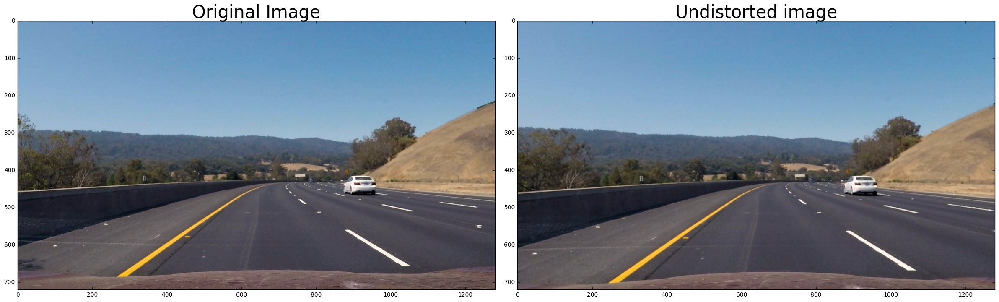

In [3]:
# Example using 1 image
frame = cv2.imread('./test_images/test3.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Calibrate camera
cam_calibration = CameraCalibrator(p_file='./camera_cal/calibration_mat.p', img_dir=None)
mtx, dst, img_size = cam_calibration.get()
row = img_size[0]
col = img_size[1]

# Un-distort image
undst_img = cv2.undistort(frame, mtx, dst)

f, ax = plt.subplots(1, 2, figsize =(24,9))
f.tight_layout()
ax[0].imshow(frame)
ax[0].set_title('Original Image', fontsize=30)
ax[1].imshow(undst_img)
ax[1].set_title('Undistorted image', fontsize=30)

plt.show()


## 2. Extract features from Image

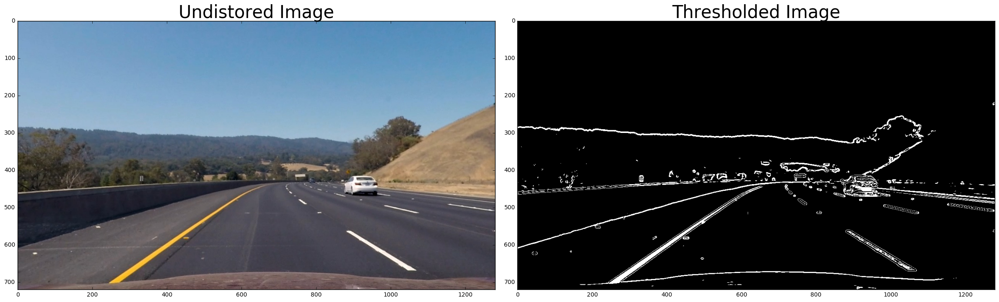

In [4]:
# Example using 1 image
frame = cv2.imread('./test_images/test3.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

undst_img = cv2.undistort(frame, mtx, dst)
# Threshold image
binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))

# Display image
f, ax = plt.subplots(1, 2, figsize =(24,9))
f.tight_layout()
ax[0].imshow(undst_img)
ax[0].set_title('Undistored Image', fontsize=30)
ax[1].imshow(binary_img, cmap='gray')
ax[1].set_title('Thresholded Image', fontsize=30)
plt.show()

## 3. Perspective Transform (Bird-Eye View)

In [5]:
# Define source and destination points
offset = 300
src = np.float32([[[col * 0.05, row],                   # bottom-left
                   [col * 0.95, row],                   # bottom-right
                   [col * 0.60, row * 0.62],            # top-right
                   [col * 0.43, row * 0.62]]])          # top-left

dst = np.float32([[col*0.15 + offset, row],             # bottom left
                  [col*0.90 - offset, row],             # bottom right
                  [col- offset, 0],               # top right
                  [offset, 0]])              # top left

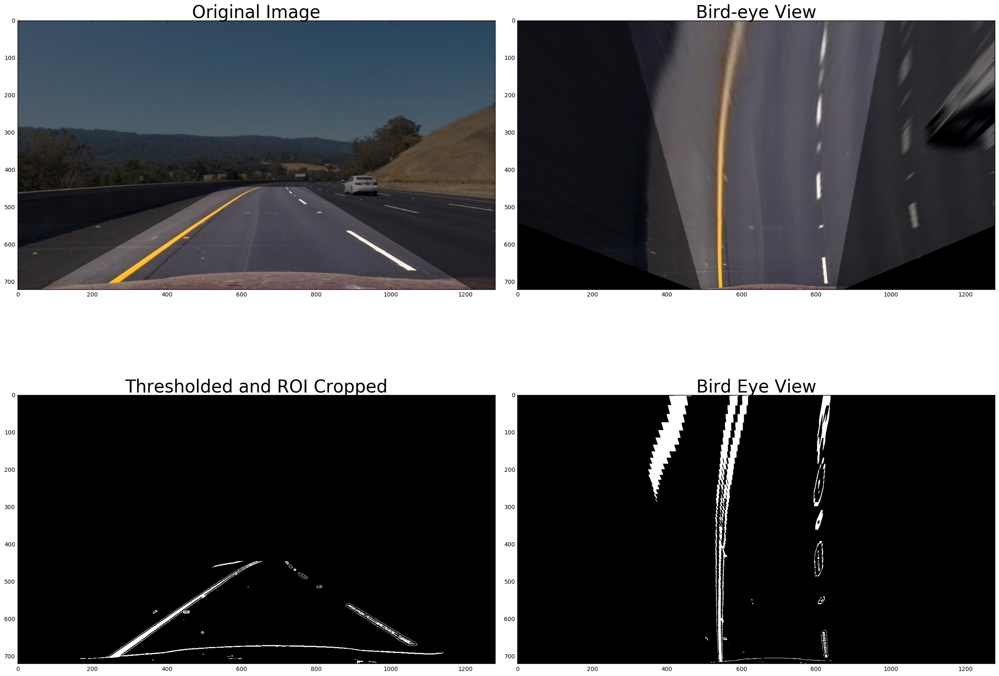

In [6]:
# Example using 1 image
frame = cv2.imread('./test_images/test8.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Perspective Transform
projmgr = ProjectionManager(cam_calibration, row, col,src, dst, offset=300)

# undst_img = cv2.undistort(frame, mtx, dst)
binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))

# Show what get transformed.
undst_roi = region_of_interest(undst_img, projmgr.get_roi())
binary_roi = region_of_interest(binary_img, projmgr.get_roi())
# Merge to original image
undst_img = cv2.addWeighted(undst_img, 0.5, undst_roi, 0.5, 0.0)
binary_img = cv2.addWeighted(binary_img, 0.5, binary_roi, 0.5, 0.0)

# Convert to Bird-eye view
undst_birdeye = projmgr.get_birdeye_view(undst_img)
binary_birdeye = projmgr.get_birdeye_view(binary_img)


# Display bir
f, ax = plt.subplots(2, 2, figsize=(24, 18))
f.tight_layout()
ax[0, 0].imshow(undst_img)
ax[0, 0].set_title('Original Image', fontsize=30)
ax[0, 1].imshow(undst_birdeye)
ax[0, 1].set_title('Bird-eye View', fontsize=30)
ax[1, 0].imshow(binary_img, cmap='gray')
ax[1, 0].set_title('Thresholded and ROI Cropped', fontsize=30)
ax[1, 1].imshow(binary_birdeye, cmap='gray')
ax[1, 1].set_title('Bird Eye View', fontsize=30)
plt.show()

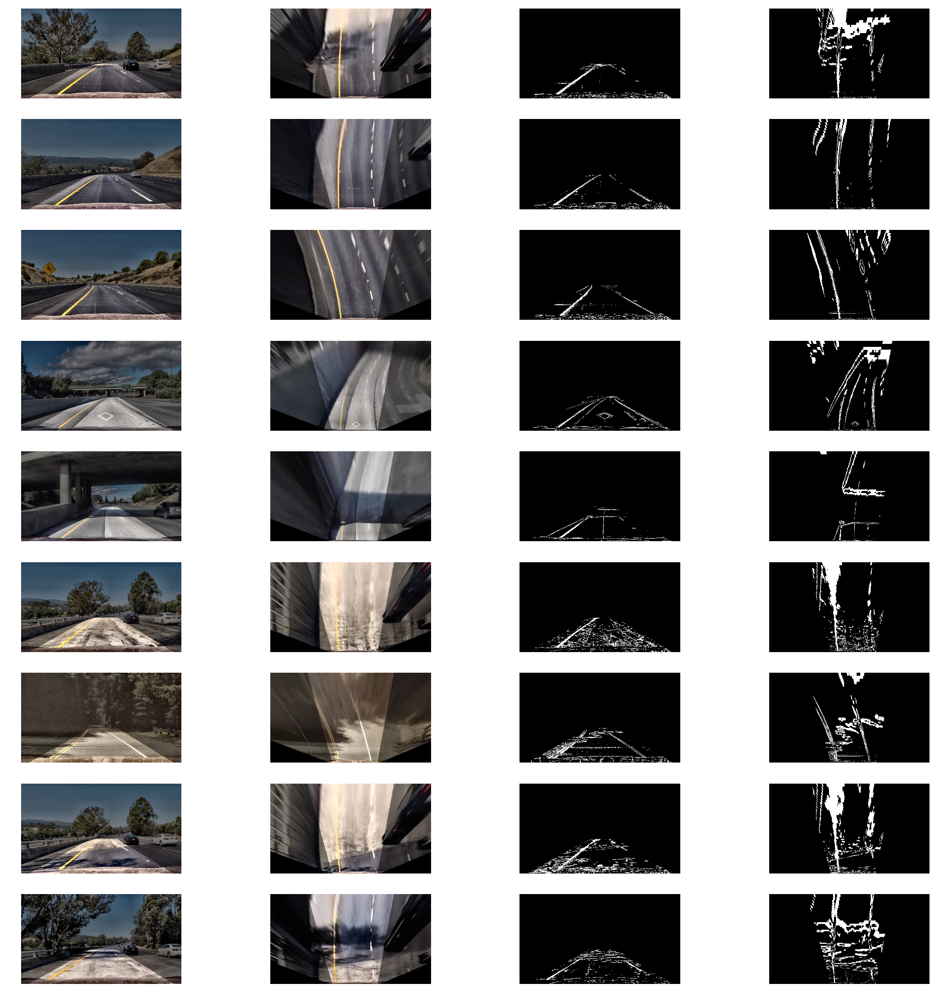

In [7]:
# Now let try in a loop
grid = len(test_imgs)

f, ax = plt.subplots(grid, 4, figsize =(20,20))
f.tight_layout()
for idx, test_img in enumerate(test_imgs):
    img = cv2.imread(test_img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undst_img = adaptive_equalize_image(img, level=3)
    binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))
    # Show what get transformed.
    undst_roi = region_of_interest(undst_img, projmgr.get_roi())
    binary_roi = region_of_interest(binary_img, projmgr.get_roi())
    # Merge to original image
    undst_img = cv2.addWeighted(undst_img, 0.5, undst_roi, 0.5, 0.0)
    binary_img = cv2.addWeighted(binary_img, 0.5, binary_roi, 0.5, 0.0)

    # Convert to Bird-eye view
    undst_birdeye = projmgr.get_birdeye_view(undst_img)
    binary_birdeye = projmgr.get_birdeye_view(binary_img)
    ax[idx, 0].imshow(undst_img)
    ax[idx, 1].imshow(undst_birdeye)
    ax[idx, 2].imshow(binary_img, cmap='gray')
    ax[idx, 3].imshow(binary_birdeye, cmap='gray')
    # Turn off axis
    ax[idx, 0].axis('off'), ax[idx, 1].axis('off'),ax[idx, 2].axis('off'), ax[idx, 3].axis('off')
plt.show()

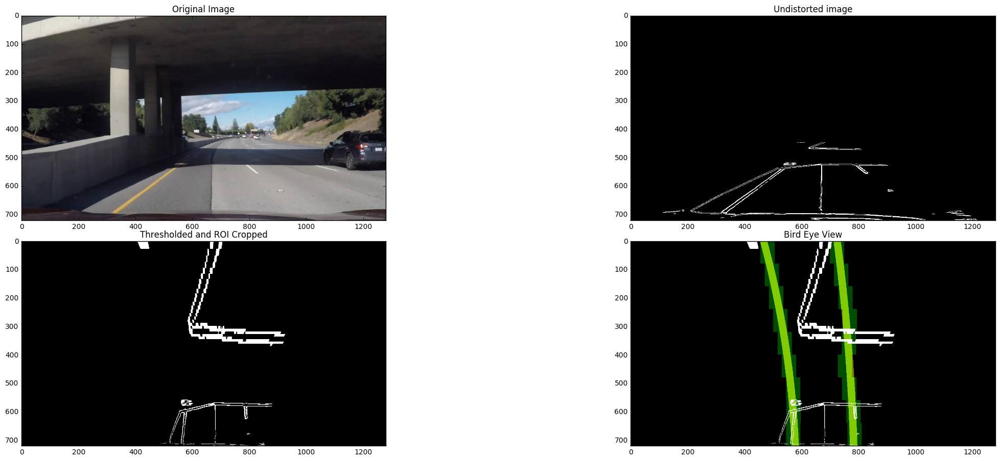

In [10]:
# Example using 1 image
frame = cv2.imread('./test_images/test8.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

projmgr = ProjectionManager(cam_calibration, row, col,src, dst, offset=300)
# undst_img = cv2.undistort(frame, mtx, dst)
undst_img = frame
binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))
binary_img = region_of_interest(binary_img, projmgr.get_roi())
birdeye_img = projmgr.get_birdeye_view(binary_img)
birdeye_undst = projmgr.get_birdeye_view(undst_img)

# Lane Fitting and Tracking
curve_centers = LineTracker(window_height=80, window_width=25, margin=15, ym=10/720, xm=4/384, smooth_factor=15)
# Sliding window
window_centroids = curve_centers.find_lane_line(warped=birdeye_img)
result, leftx, rightx = draw_windows(birdeye_img, w=25, h=80, window_centroids=window_centroids)

# Curve-fit
lane_lines = curve_centers.curve_fit(result, leftx, rightx)

# Convert back to normal view
#lane_lines = projmgr.get_normal_view(lane_lines)

# Merge to original image
lane_lines = cv2.addWeighted(result, 1.0, lane_lines, 0.5, 0.0)
f, ax = plt.subplots(2, 2, figsize =(24,9))
f.tight_layout()
ax[0, 0].imshow(undst_img)
ax[0, 0].set_title('Original Image')
ax[0, 1].imshow(binary_img, cmap='gray')
ax[0, 1].set_title('Undistorted image')
ax[1, 0].imshow(birdeye_img, cmap='gray')
ax[1, 0].set_title('Thresholded and ROI Cropped')
ax[1, 1].imshow(lane_lines)
ax[1, 1].set_title('Bird Eye View')
plt.show()

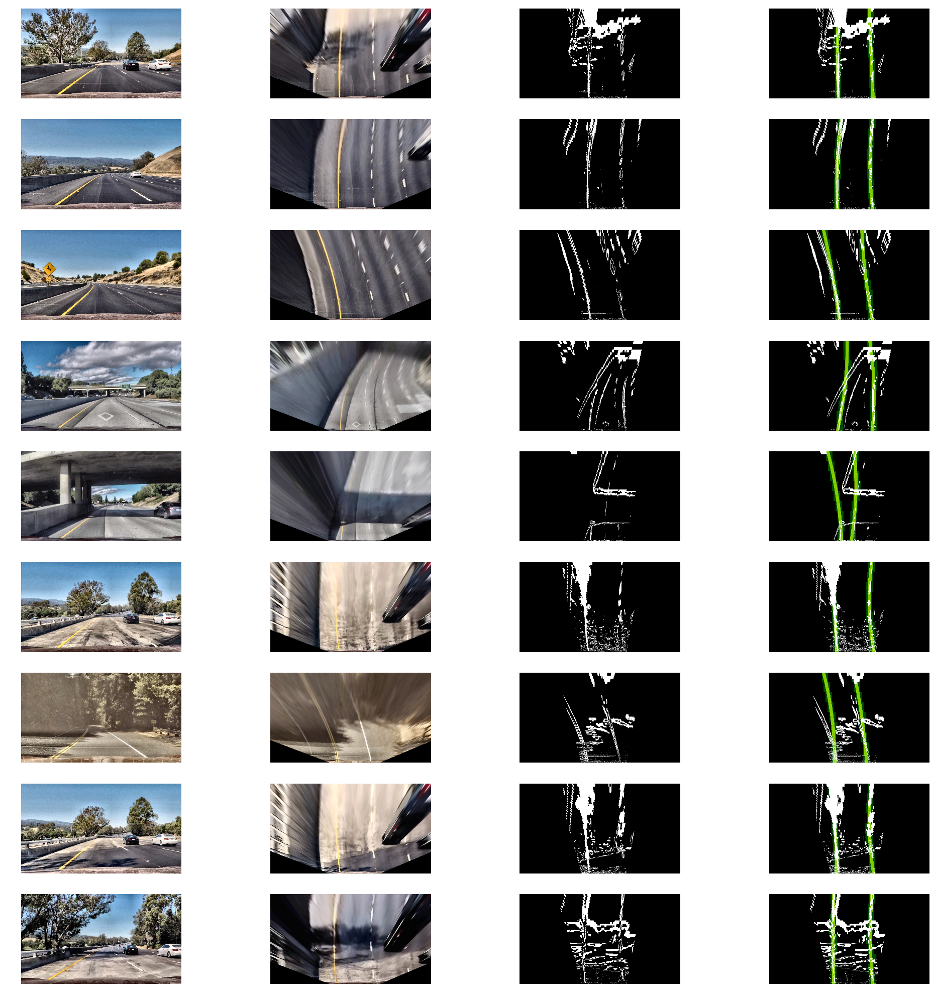

In [12]:
# Now let try in a loop
grid = len(test_imgs)

f, ax = plt.subplots(grid, 4, figsize =(20,20))
f.tight_layout()
for idx, test_img in enumerate(test_imgs):
    img = cv2.imread(test_img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undst_img = adaptive_equalize_image(img, level=3)
    binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))
    binary_img = region_of_interest(binary_img, projmgr.get_roi())
    birdeye_img = projmgr.get_birdeye_view(binary_img)
    birdeye_undst = projmgr.get_birdeye_view(undst_img)
    # Lane Fitting and Tracking
    curve_centers = LineTracker(window_height=80, window_width=25, margin=15, ym=10/720, xm=4/384, smooth_factor=15)
    # Sliding window
    window_centroids = curve_centers.find_lane_line(warped=birdeye_img)
    result, leftx, rightx = draw_windows(birdeye_img, w=25, h=80, window_centroids=window_centroids)
    # Curve-fit
    lane_lines = curve_centers.curve_fit(result, leftx, rightx)
    # Merge to original image
    lane_lines = cv2.addWeighted(result, 1.0, lane_lines, 0.5, 0.0)
    # Convert to Bird-eye view
    undst_birdeye = projmgr.get_birdeye_view(undst_img)
    binary_birdeye = projmgr.get_birdeye_view(binary_img)
    ax[idx, 0].imshow(undst_img)
    ax[idx, 1].imshow(undst_birdeye)
    ax[idx, 2].imshow(birdeye_img, cmap='gray')
    ax[idx, 3].imshow(lane_lines)
    # Turn off axis
    ax[idx, 0].axis('off'), ax[idx, 1].axis('off'),ax[idx, 2].axis('off'), ax[idx, 3].axis('off')
plt.show()